In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 10.3 MB/s 
     |████████████████████████████████| 190 kB 5.0 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7165, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (138/138), done.
remote: Total 7165 (delta 46), reused 154 (delta 39), pack-reused 6988
Receiving objects: 100% (7165/7165), 13.86 MiB | 42.36 MiB/s, done.
Resolving deltas: 100% (5213/5213), done.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla P100-PCIE-16GB)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-20 14:04:23--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  8.89MB/s    in 37s     

2022-05-20 14:05:01 (8.43 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 128]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.model.decode_head.loss_decode = [dict(type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0),
                                     dict(type='FocalLoss', loss_weight = 1.0)]

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=[
            dict(type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0),
            d

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-20 14:05:04,595 - mmseg - INFO - Loaded 537 images
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '
2022-05-20 14:05:17,076 - mmseg - INFO - Loaded 113 images
2022-05-20 14:05:17,080 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-20 14:05:17,598 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 452s, ETA:     0s

2022-05-20 14:19:40,568 - mmseg - INFO - per class results:
2022-05-20 14:19:40,570 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 86.24 | 90.09 |
|  building  | 75.09 | 90.66 |
+------------+-------+-------+
2022-05-20 14:19:40,571 - mmseg - INFO - Summary:
2022-05-20 14:19:40,572 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.27 | 80.66 | 90.37 |
+-------+-------+-------+
2022-05-20 14:19:40,575 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9027, mIoU: 0.8066, mAcc: 0.9037, IoU.background: 0.8624, IoU.building: 0.7509, Acc.background: 0.9009, Acc.building: 0.9066
2022-05-20 14:20:22,100 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 4:18:59, time: 4.934, data_time: 4.546, memory: 3323, decode.loss_ce: 0.2942, decode.loss_focal: 0.0407, decode.acc_seg: 87.6180, loss: 0.3348
2022-05-20 14:21:01,605 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 14:33:41,409 - mmseg - INFO - per class results:
2022-05-20 14:33:41,411 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 88.83 | 94.17 |
|  building  | 77.94 | 87.44 |
+------------+-------+-------+
2022-05-20 14:33:41,412 - mmseg - INFO - Summary:
2022-05-20 14:33:41,415 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 91.99 | 83.39 | 90.8 |
+-------+-------+------+
2022-05-20 14:33:41,417 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9199, mIoU: 0.8339, mAcc: 0.9080, IoU.background: 0.8883, IoU.building: 0.7794, Acc.background: 0.9417, Acc.building: 0.8744
2022-05-20 14:34:20,636 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 4:07:36, time: 4.730, data_time: 4.345, memory: 3323, decode.loss_ce: 0.2646, decode.loss_focal: 0.0373, decode.acc_seg: 88.8706, loss: 0.3019
2022-05-20 14:35:02,039 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, eta: 4:00

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 14:47:39,470 - mmseg - INFO - per class results:
2022-05-20 14:47:39,472 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.76 | 94.84 |
|  building  | 79.59 | 88.18 |
+------------+-------+-------+
2022-05-20 14:47:39,473 - mmseg - INFO - Summary:
2022-05-20 14:47:39,475 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.68 | 84.67 | 91.51 |
+-------+-------+-------+
2022-05-20 14:47:39,478 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9268, mIoU: 0.8467, mAcc: 0.9151, IoU.background: 0.8976, IoU.building: 0.7959, Acc.background: 0.9484, Acc.building: 0.8818
2022-05-20 14:48:18,771 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 3:54:31, time: 4.730, data_time: 4.344, memory: 3323, decode.loss_ce: 0.2063, decode.loss_focal: 0.0285, decode.acc_seg: 91.5092, loss: 0.2348
2022-05-20 14:48:58,236 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 15:01:34,737 - mmseg - INFO - per class results:
2022-05-20 15:01:34,739 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.91 | 94.61 |
|  building  | 80.05 | 89.08 |
+------------+-------+-------+
2022-05-20 15:01:34,742 - mmseg - INFO - Summary:
2022-05-20 15:01:34,745 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.82 | 84.98 | 91.84 |
+-------+-------+-------+
2022-05-20 15:01:34,746 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9282, mIoU: 0.8498, mAcc: 0.9184, IoU.background: 0.8991, IoU.building: 0.8005, Acc.background: 0.9461, Acc.building: 0.8908
2022-05-20 15:02:13,892 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 3:40:48, time: 4.713, data_time: 4.328, memory: 3323, decode.loss_ce: 0.2161, decode.loss_focal: 0.0303, decode.acc_seg: 90.8899, loss: 0.2464
2022-05-20 15:02:53,329 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 15:15:32,468 - mmseg - INFO - per class results:
2022-05-20 15:15:32,469 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.99 | 94.78 |
|  building  | 80.14 | 88.89 |
+------------+-------+-------+
2022-05-20 15:15:32,470 - mmseg - INFO - Summary:
2022-05-20 15:15:32,473 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.87 | 85.07 | 91.83 |
+-------+-------+-------+
2022-05-20 15:15:32,474 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9287, mIoU: 0.8507, mAcc: 0.9183, IoU.background: 0.8999, IoU.building: 0.8014, Acc.background: 0.9478, Acc.building: 0.8889
2022-05-20 15:16:11,844 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 3:27:08, time: 4.729, data_time: 4.342, memory: 3323, decode.loss_ce: 0.1802, decode.loss_focal: 0.0247, decode.acc_seg: 92.5727, loss: 0.2049
2022-05-20 15:16:51,232 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 15:29:33,132 - mmseg - INFO - per class results:
2022-05-20 15:29:33,134 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.28 | 94.66 |
|  building  | 80.83 | 89.86 |
+------------+-------+-------+
2022-05-20 15:29:33,135 - mmseg - INFO - Summary:
2022-05-20 15:29:33,137 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.11 | 85.56 | 92.26 |
+-------+-------+-------+
2022-05-20 15:29:33,139 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9311, mIoU: 0.8556, mAcc: 0.9226, IoU.background: 0.9028, IoU.building: 0.8083, Acc.background: 0.9466, Acc.building: 0.8986
2022-05-20 15:30:12,646 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 3:13:29, time: 4.733, data_time: 4.345, memory: 3323, decode.loss_ce: 0.1833, decode.loss_focal: 0.0252, decode.acc_seg: 92.4676, loss: 0.2085
2022-05-20 15:30:52,298 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 15:43:34,241 - mmseg - INFO - per class results:
2022-05-20 15:43:34,243 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.58 | 95.62 |
|  building  | 80.95 | 88.37 |
+------------+-------+-------+
2022-05-20 15:43:34,244 - mmseg - INFO - Summary:
2022-05-20 15:43:34,246 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.27 | 85.77 | 92.0 |
+-------+-------+------+
2022-05-20 15:43:34,249 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9327, mIoU: 0.8577, mAcc: 0.9200, IoU.background: 0.9058, IoU.building: 0.8095, Acc.background: 0.9562, Acc.building: 0.8837
2022-05-20 15:44:13,627 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 2:59:44, time: 4.736, data_time: 4.349, memory: 3323, decode.loss_ce: 0.1806, decode.loss_focal: 0.0256, decode.acc_seg: 92.5626, loss: 0.2062
2022-05-20 15:44:53,285 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta: 2:57

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 15:57:33,723 - mmseg - INFO - per class results:
2022-05-20 15:57:33,724 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.93 | 95.34 |
|  building  | 81.88 | 89.85 |
+------------+-------+-------+
2022-05-20 15:57:33,726 - mmseg - INFO - Summary:
2022-05-20 15:57:33,728 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 93.56 | 86.4 | 92.6 |
+-------+------+------+
2022-05-20 15:57:33,731 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9356, mIoU: 0.8640, mAcc: 0.9260, IoU.background: 0.9093, IoU.building: 0.8188, Acc.background: 0.9534, Acc.building: 0.8985
2022-05-20 15:58:15,375 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 2:45:57, time: 4.757, data_time: 4.368, memory: 3323, decode.loss_ce: 0.1685, decode.loss_focal: 0.0234, decode.acc_seg: 92.9320, loss: 0.1919
2022-05-20 15:58:54,985 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, eta: 2:43:30, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 433s, ETA:     0s

2022-05-20 16:11:33,318 - mmseg - INFO - per class results:
2022-05-20 16:11:33,319 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.68 |  95.4 |
|  building  | 81.31 | 89.13 |
+------------+-------+-------+
2022-05-20 16:11:33,320 - mmseg - INFO - Summary:
2022-05-20 16:11:33,322 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.37 | 86.0 | 92.26 |
+-------+------+-------+
2022-05-20 16:11:33,325 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9337, mIoU: 0.8600, mAcc: 0.9226, IoU.background: 0.9068, IoU.building: 0.8131, Acc.background: 0.9540, Acc.building: 0.8913
2022-05-20 16:12:12,599 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 2:32:01, time: 4.720, data_time: 4.334, memory: 3323, decode.loss_ce: 0.1595, decode.loss_focal: 0.0218, decode.acc_seg: 93.2647, loss: 0.1814
2022-05-20 16:12:53,989 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 2:29

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 16:25:32,961 - mmseg - INFO - per class results:
2022-05-20 16:25:32,962 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.91 | 94.63 |
|  building  | 82.22 | 91.46 |
+------------+-------+-------+
2022-05-20 16:25:32,964 - mmseg - INFO - Summary:
2022-05-20 16:25:32,968 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.6 | 86.57 | 93.04 |
+------+-------+-------+
2022-05-20 16:25:32,970 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9360, mIoU: 0.8657, mAcc: 0.9304, IoU.background: 0.9091, IoU.building: 0.8222, Acc.background: 0.9463, Acc.building: 0.9146
2022-05-20 16:26:12,661 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 2:18:07, time: 4.741, data_time: 4.351, memory: 3323, decode.loss_ce: 0.1622, decode.loss_focal: 0.0222, decode.acc_seg: 93.3210, loss: 0.1844
2022-05-20 16:26:52,433 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 2:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 16:39:35,915 - mmseg - INFO - per class results:
2022-05-20 16:39:35,916 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.9 |  94.3 |
|  building  | 82.37 | 92.18 |
+------------+-------+-------+
2022-05-20 16:39:35,918 - mmseg - INFO - Summary:
2022-05-20 16:39:35,920 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.62 | 86.64 | 93.24 |
+-------+-------+-------+
2022-05-20 16:39:35,924 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9362, mIoU: 0.8664, mAcc: 0.9324, IoU.background: 0.9090, IoU.building: 0.8237, Acc.background: 0.9430, Acc.building: 0.9218
2022-05-20 16:40:15,598 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 2:04:15, time: 4.740, data_time: 4.350, memory: 3323, decode.loss_ce: 0.1417, decode.loss_focal: 0.0197, decode.acc_seg: 94.2839, loss: 0.1614
2022-05-20 16:40:55,282 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 16:53:39,386 - mmseg - INFO - per class results:
2022-05-20 16:53:39,388 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.78 | 96.33 |
|  building  |  81.0 | 87.22 |
+------------+-------+-------+
2022-05-20 16:53:39,390 - mmseg - INFO - Summary:
2022-05-20 16:53:39,392 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.38 | 85.89 | 91.77 |
+-------+-------+-------+
2022-05-20 16:53:39,394 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9338, mIoU: 0.8589, mAcc: 0.9177, IoU.background: 0.9078, IoU.building: 0.8100, Acc.background: 0.9633, Acc.building: 0.8722
2022-05-20 16:54:19,045 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 1:50:21, time: 4.740, data_time: 4.350, memory: 3323, decode.loss_ce: 0.1622, decode.loss_focal: 0.0223, decode.acc_seg: 93.0613, loss: 0.1844
2022-05-20 16:54:58,749 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 17:07:41,293 - mmseg - INFO - per class results:
2022-05-20 17:07:41,295 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.96 | 95.74 |
|  building  | 81.73 | 89.02 |
+------------+-------+-------+
2022-05-20 17:07:41,298 - mmseg - INFO - Summary:
2022-05-20 17:07:41,299 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.56 | 86.34 | 92.38 |
+-------+-------+-------+
2022-05-20 17:07:41,301 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9356, mIoU: 0.8634, mAcc: 0.9238, IoU.background: 0.9096, IoU.building: 0.8173, Acc.background: 0.9574, Acc.building: 0.8902
2022-05-20 17:08:20,694 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 1:36:24, time: 4.737, data_time: 4.349, memory: 3323, decode.loss_ce: 0.1513, decode.loss_focal: 0.0208, decode.acc_seg: 93.6576, loss: 0.1722
2022-05-20 17:09:00,023 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 17:21:42,861 - mmseg - INFO - per class results:
2022-05-20 17:21:42,862 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.01 | 94.64 |
|  building  | 82.41 | 91.65 |
+------------+-------+-------+
2022-05-20 17:21:42,864 - mmseg - INFO - Summary:
2022-05-20 17:21:42,865 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.67 | 86.71 | 93.14 |
+-------+-------+-------+
2022-05-20 17:21:42,868 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9367, mIoU: 0.8671, mAcc: 0.9314, IoU.background: 0.9101, IoU.building: 0.8241, Acc.background: 0.9464, Acc.building: 0.9165
2022-05-20 17:22:22,754 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 1:22:28, time: 4.744, data_time: 4.352, memory: 3323, decode.loss_ce: 0.1534, decode.loss_focal: 0.0215, decode.acc_seg: 93.7502, loss: 0.1749
2022-05-20 17:23:02,502 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 17:35:43,146 - mmseg - INFO - per class results:
2022-05-20 17:35:43,148 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.3 | 94.96 |
|  building  | 82.88 | 91.63 |
+------------+-------+-------+
2022-05-20 17:35:43,149 - mmseg - INFO - Summary:
2022-05-20 17:35:43,152 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.88 | 87.09 | 93.29 |
+-------+-------+-------+
2022-05-20 17:35:43,155 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9388, mIoU: 0.8709, mAcc: 0.9329, IoU.background: 0.9130, IoU.building: 0.8288, Acc.background: 0.9496, Acc.building: 0.9163
2022-05-20 17:36:25,186 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:08:30, time: 4.743, data_time: 4.351, memory: 3323, decode.loss_ce: 0.1505, decode.loss_focal: 0.0210, decode.acc_seg: 93.6638, loss: 0.1715
2022-05-20 17:37:04,866 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 17:49:45,855 - mmseg - INFO - per class results:
2022-05-20 17:49:45,857 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.41 |  95.2 |
|  building  |  83.0 | 91.33 |
+------------+-------+-------+
2022-05-20 17:49:45,858 - mmseg - INFO - Summary:
2022-05-20 17:49:45,860 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.95 | 87.21 | 93.27 |
+-------+-------+-------+
2022-05-20 17:49:45,863 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9395, mIoU: 0.8721, mAcc: 0.9327, IoU.background: 0.9141, IoU.building: 0.8300, Acc.background: 0.9520, Acc.building: 0.9133
2022-05-20 17:50:25,690 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:54:32, time: 4.722, data_time: 4.330, memory: 3323, decode.loss_ce: 0.1476, decode.loss_focal: 0.0202, decode.acc_seg: 93.8329, loss: 0.1678
2022-05-20 17:51:07,513 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 18:03:46,299 - mmseg - INFO - per class results:
2022-05-20 18:03:46,300 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.26 | 94.84 |
|  building  | 82.86 |  91.8 |
+------------+-------+-------+
2022-05-20 18:03:46,302 - mmseg - INFO - Summary:
2022-05-20 18:03:46,304 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.86 | 87.06 | 93.32 |
+-------+-------+-------+
2022-05-20 18:03:46,306 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9386, mIoU: 0.8706, mAcc: 0.9332, IoU.background: 0.9126, IoU.building: 0.8286, Acc.background: 0.9484, Acc.building: 0.9180
2022-05-20 18:04:26,151 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:40:33, time: 4.722, data_time: 4.330, memory: 3323, decode.loss_ce: 0.1428, decode.loss_focal: 0.0200, decode.acc_seg: 94.0891, loss: 0.1628
2022-05-20 18:05:08,008 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 18:17:43,910 - mmseg - INFO - per class results:
2022-05-20 18:17:43,912 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.28 | 95.09 |
|  building  | 82.78 | 91.28 |
+------------+-------+-------+
2022-05-20 18:17:43,914 - mmseg - INFO - Summary:
2022-05-20 18:17:43,916 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.86 | 87.03 | 93.18 |
+-------+-------+-------+
2022-05-20 18:17:43,920 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9386, mIoU: 0.8703, mAcc: 0.9318, IoU.background: 0.9128, IoU.building: 0.8278, Acc.background: 0.9509, Acc.building: 0.9128
2022-05-20 18:18:23,482 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:26:34, time: 4.719, data_time: 4.330, memory: 3323, decode.loss_ce: 0.1479, decode.loss_focal: 0.0203, decode.acc_seg: 93.7068, loss: 0.1682
2022-05-20 18:19:03,087 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, et

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 18:31:42,438 - mmseg - INFO - per class results:
2022-05-20 18:31:42,440 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.5 | 95.77 |
|  building  | 82.91 | 90.23 |
+------------+-------+-------+
2022-05-20 18:31:42,442 - mmseg - INFO - Summary:
2022-05-20 18:31:42,445 - mmseg - INFO - 
+-------+------+------+
|  aAcc | mIoU | mAcc |
+-------+------+------+
| 93.98 | 87.2 | 93.0 |
+-------+------+------+
2022-05-20 18:31:42,448 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9398, mIoU: 0.8720, mAcc: 0.9300, IoU.background: 0.9150, IoU.building: 0.8291, Acc.background: 0.9577, Acc.building: 0.9023
2022-05-20 18:32:22,261 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:12:35, time: 4.722, data_time: 4.330, memory: 3323, decode.loss_ce: 0.1513, decode.loss_focal: 0.0212, decode.acc_seg: 93.7722, loss: 0.1725
2022-05-20 18:33:01,930 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, eta: 0:11:09

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 18:45:41,904 - mmseg - INFO - per class results:
2022-05-20 18:45:41,906 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.52 | 95.86 |
|  building  | 82.92 |  90.1 |
+------------+-------+-------+
2022-05-20 18:45:41,907 - mmseg - INFO - Summary:
2022-05-20 18:45:41,909 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.99 | 87.22 | 92.98 |
+-------+-------+-------+
2022-05-20 18:45:41,912 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9399, mIoU: 0.8722, mAcc: 0.9298, IoU.background: 0.9152, IoU.building: 0.8292, Acc.background: 0.9586, Acc.building: 0.9010


### 모델 결과 시각화

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


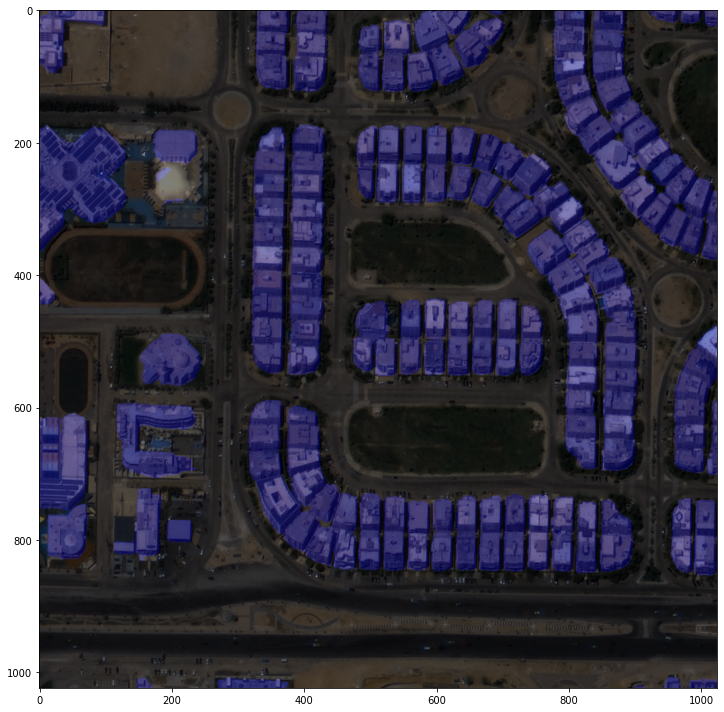

In [16]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


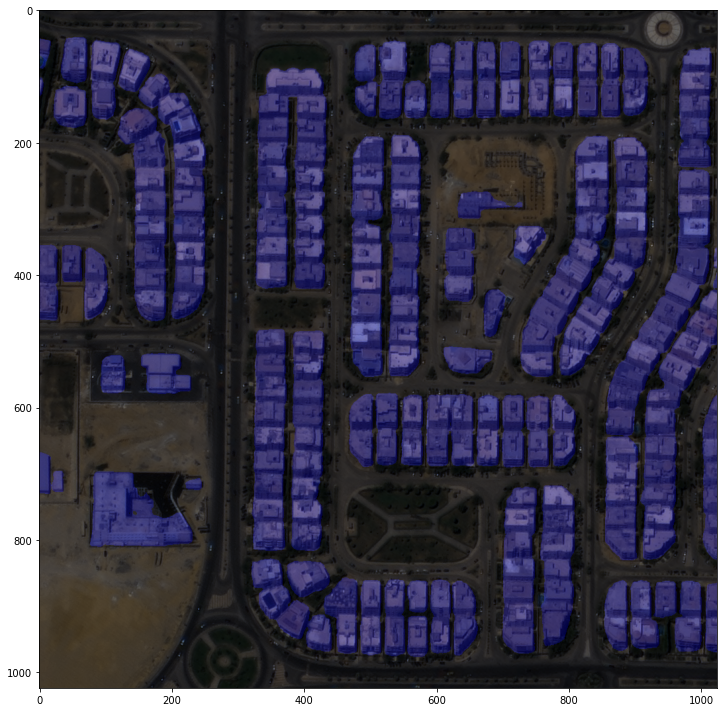

In [17]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


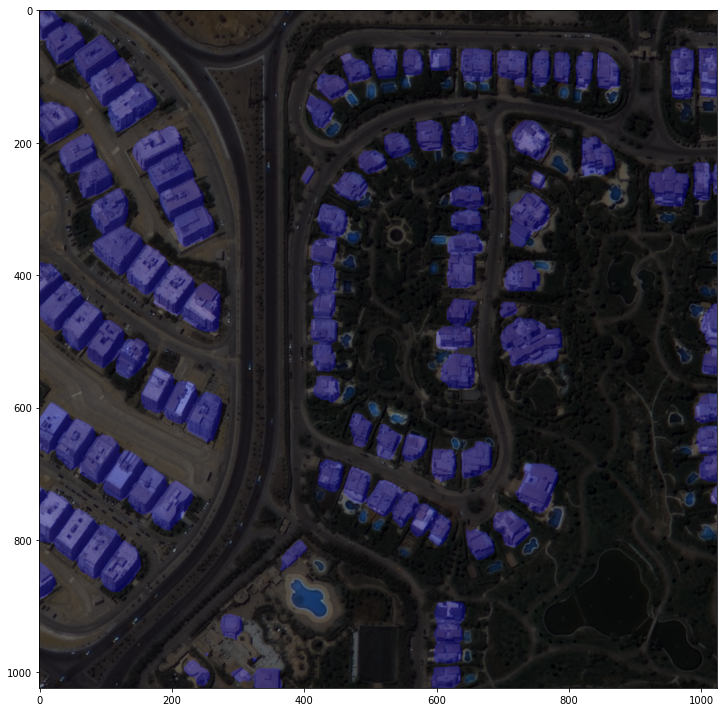

In [18]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


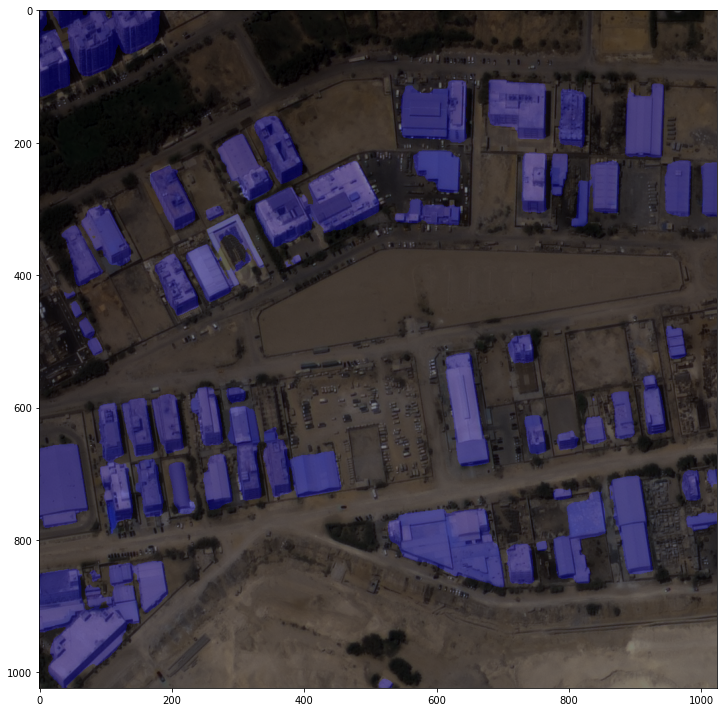

In [19]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


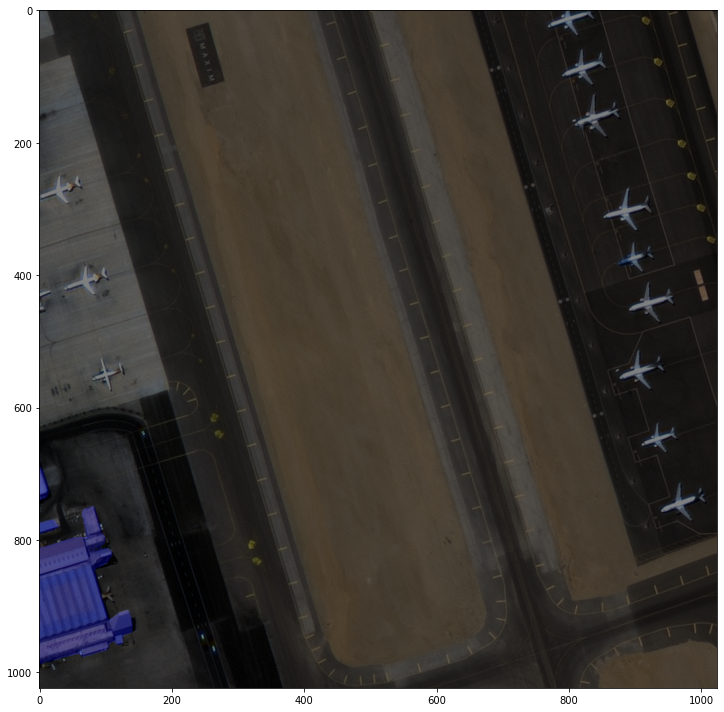

In [20]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


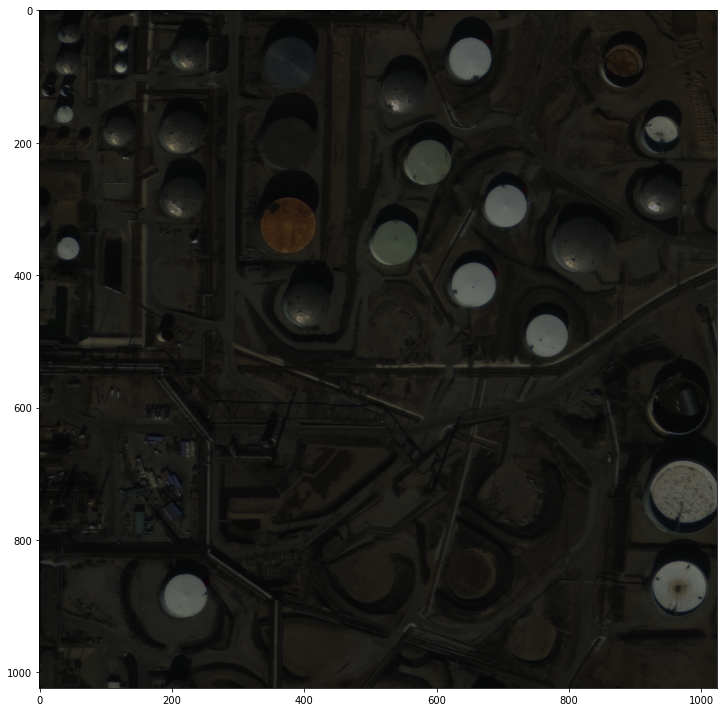

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


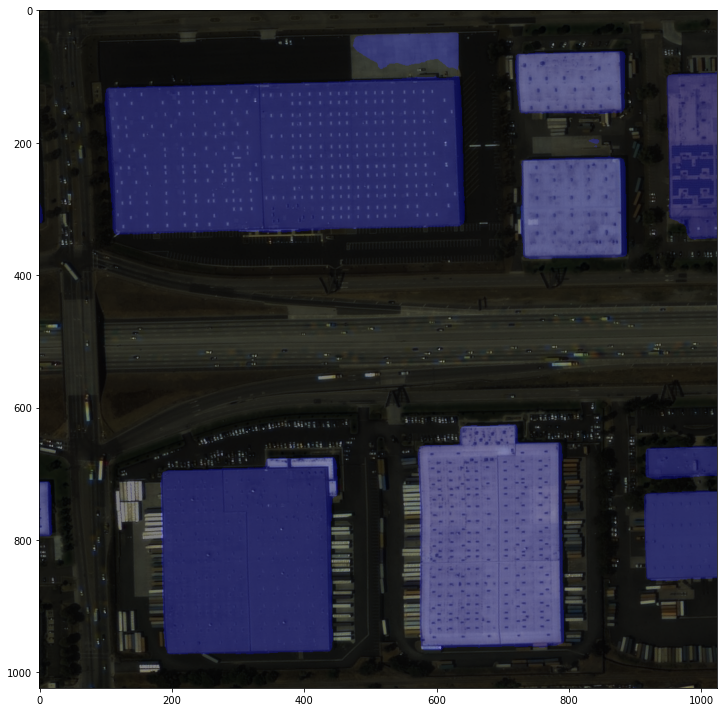

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


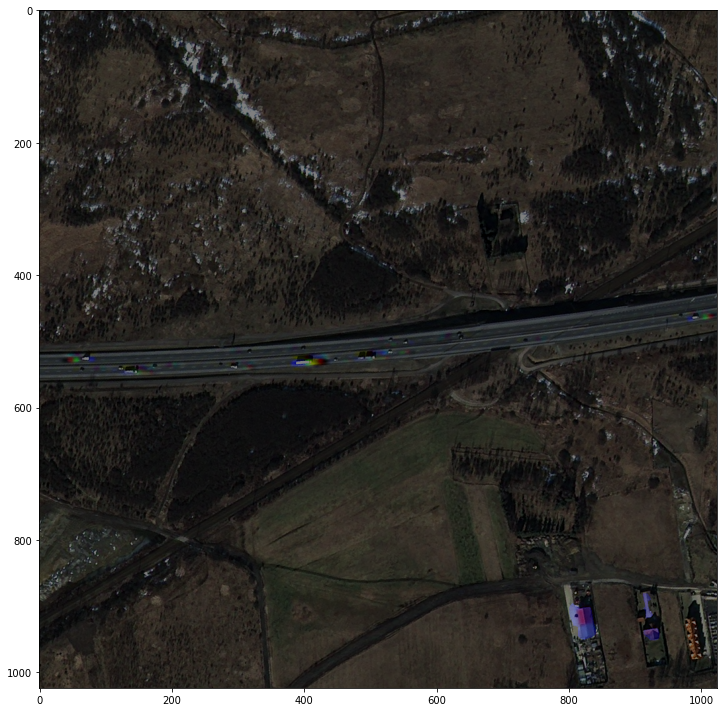

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


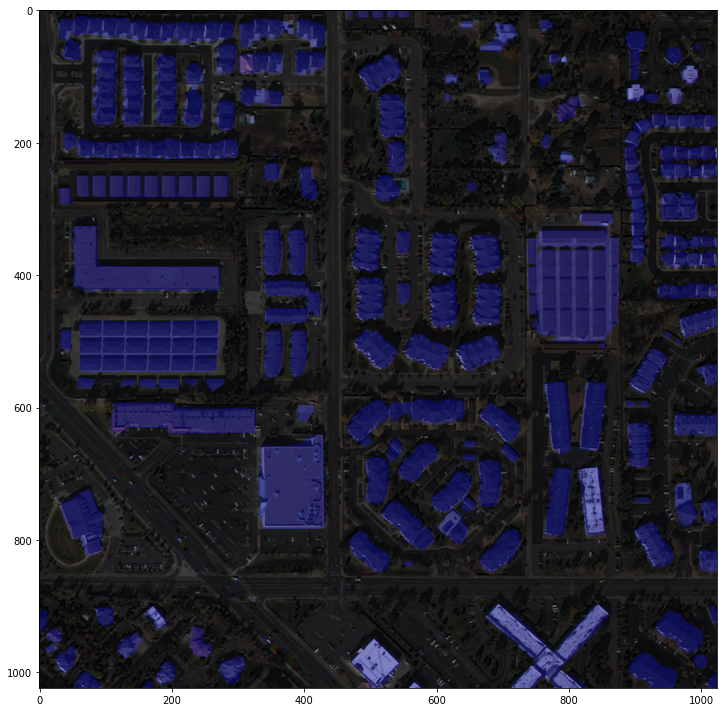

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


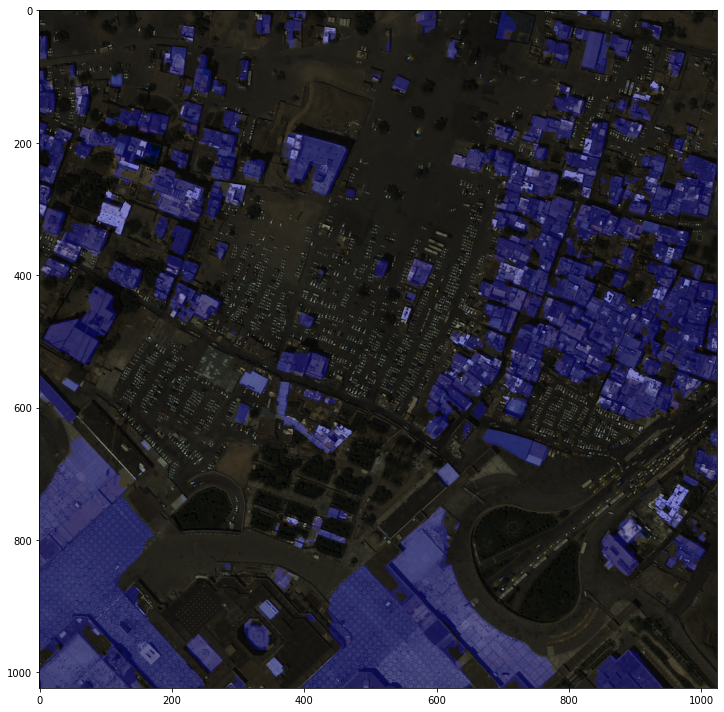

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


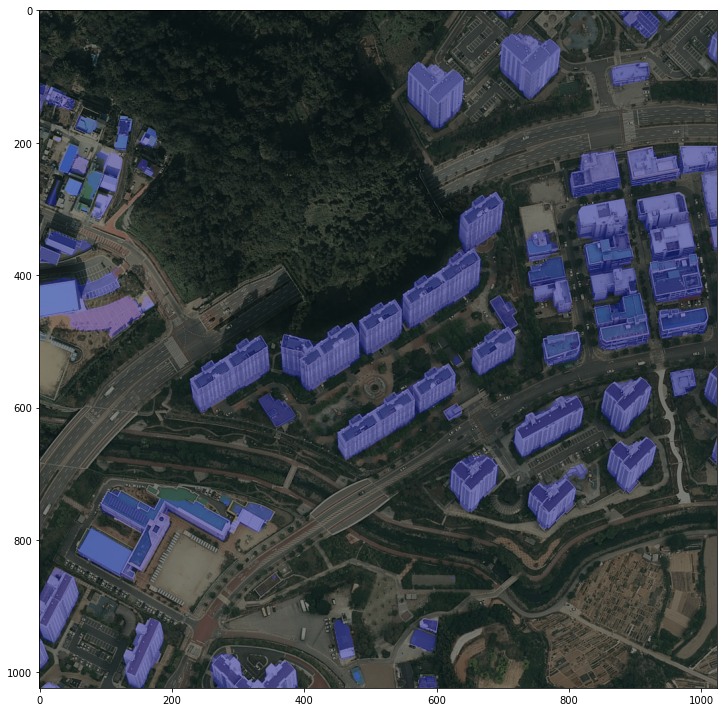

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


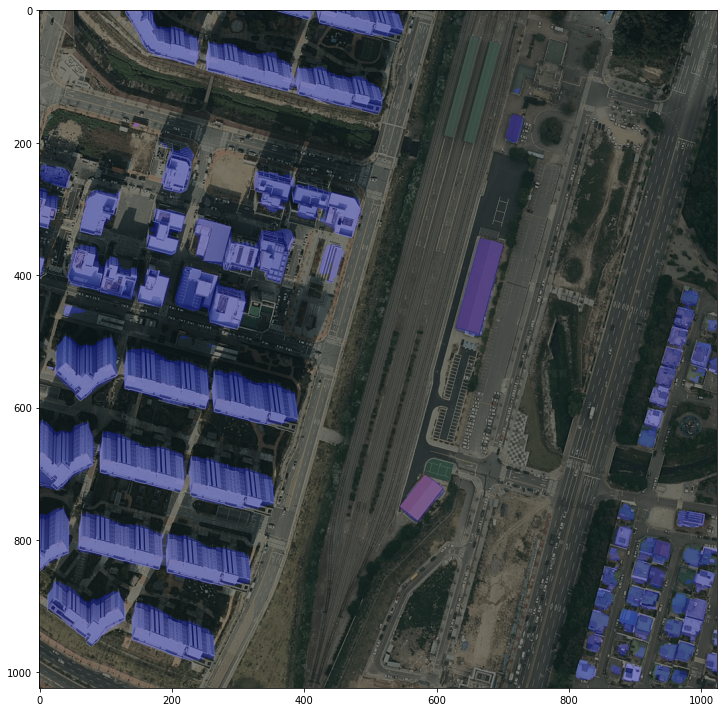

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


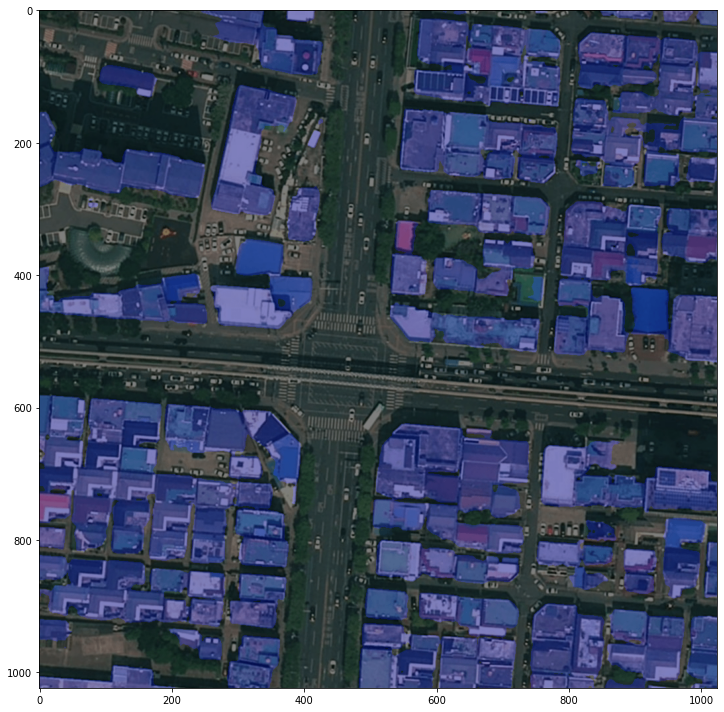

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_focal/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


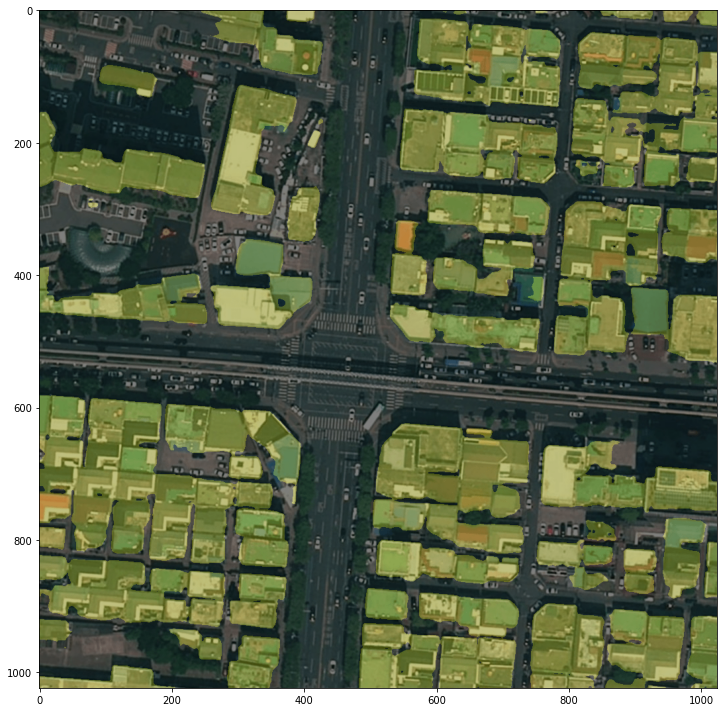

In [29]:
palette_1 = [[0, 0, 0], [128, 128, 0]]
show_result_pyplot(model_ckpt, img, result, palette_1)
